# L1b test scenes

This notebook illustrates the use of the L1b CIMR data reader. The reader reads data in the L1b format from the SCEPS or DEIMOS CIMR satellite simulator.
Here, the DEVALGO test scenes are used as input data.
All code cells are executed when the notebook is run only requiring the source code in the `algorithm` folder where the reader is implemented in the Julia language. 
In this notebook all cells are shown including output from the executed code.

In [1]:
using Revise
using Pkg
Pkg.activate("../algorithm/algoenv")
using OEM

  Activating project at `/mnt/pharoshome/huntemann/Projects/DEVALGO/MultiParameter_ATBD_V2/algorithm/algoenv`


In [10]:
using Proj
using LinearAlgebra
using NCDatasets
using PythonCall # to call python from julia
using PythonPlot # basically the matplotlib.pyplot module
pr = pyimport("pyresample")


Python: <module 'pyresample' from '/mnt/pharoshome/huntemann/Projects/DEVALGO/MultiParameter_ATBD_V2/algorithm/algoenv/.CondaPkg/env/lib/python3.12/site-packages/pyresample/__init__.py'>

In [3]:
#the input files can be found on the ESA DEVALGO FTP server,
#this is a named tuple with the paths to the input files
fns=(;scene1=
    (;l1b="/mnt/spaces/Projects/2022_CIMR-DEVALGO/CIMR_L1X/W_PT-DME-Lisbon-SAT-CIMR-1B_C_DME_20230420T103323_LD_20280110T114800_20280110T115700_TN.nc",
    input="/mnt/spaces/Projects/2022_CIMR-DEVALGO/Test_scenes_downscaled_projected_20230923/test_scene_1_compressed_lowres.nc"),
scene2=
    (;l1b="/mnt/spaces/Projects/2022_CIMR-DEVALGO/CIMR_L1X/W_PT-DME-Lisbon-SAT-CIMR-1B_C_DME_20230417T105425_LD_20280110T114800_20280110T115700_TN.nc",
    input="/mnt/spaces/Projects/2022_CIMR-DEVALGO/Test_scenes_downscaled_projected_20230923/test_scene_2_compressed_lowres.nc"),
scenep=
    (;
l1b="/mnt/spaces/Projects/2022_CIMR-DEVALGO/SCEPS_l1b_sceps_geo_polar_scene_1_unfiltered_tot_minimal_nom_nedt_apc_tot_v2p1.nc",
input="/mnt/spaces/Projects/2022_CIMR-DEVALGO/cimr_sceps_toa_card_devalgo_polarscene_1_20161217_v2p0_aa_000.nc"
    )
)
#can be aceesed like
fns.scene1.l1b

"/mnt/spaces/Projects/2022_CIMR-DEVALGO/CIMR_L1X/W_PT-DME-Lisbon-SAT-CIMR-1B_C_DME_20230420T103323_LD_20280110T114800_20280110T115700_TN.nc"

## Illustration of the reading routines for the data handling

First we are setting up some projection conversion. Since the CIMR L1b data is to on a regular grid, the arrays can not be directly plotted on a map. Therefore, we need to convert the data to a projection that can be plotted on a map. 

In [4]:
LLtoEASE2n = Proj.Transformation("epsg:4326", "epsg:6931")
EASE2NtoLL = inv(LLtoEASE2n)

lltoxy=LLtoEASE2n #conversion from lat/lon to EASE2 grid coordinates
xytoll=EASE2NtoLL #conversion from EASE2 grid coordinates to lat/lon
println("done importing projections")

done importing projections


Simple data reading for a single band can be done with the `get_data_for_band` function. It only requires the filename of the L1b data and the band to be read. It gets a named tuple with, `h`, `v`, `lat` and `lon`. All arrays are 1d arrays. `h` and `v` are the horizontal and vertical brightness temperatures, `lat` and `lon` are the latitude and longitude coordinates. The position in the scan is ignored as the scan direction is already selected by passing "forward" or "backward" to the function. Since this is a raw reader, there is no interpolation or other processing done on the data.

In [5]:
cband_data=get_data_for_band(fns.scene1.l1b,"L_BAND","backward")
@show keys(cband_data) #a named tuple with the keys: h, v, lat, lon,  herr, verr, oza
@show size(cband_data.h);

nedt not found, using 1.0K as uncertainty for h and v.
keys(cband_data) = (:h, :v, :herr, :verr, :lat, :lon, :oza)
size(cband_data.h) = (24495,)


Another possibility is the `project_data` data function. This also reads a file by name, but also resamples the data onto the closest grid point of the selected band. The output is three ararys with the reprojected brightness temperatures for each band, and the latitude and longitude coordinates of the grid points. The grid points are the same for all bands. The function also takes the scan direction as an argument. The projected brightness temperatures have the different channel as second dimension, starting with the lowest frequency at `v` pol. The `h` pol is the next channel, followed by the next higher frequency at `v` pol and so on, i.e., 10 dimensions in the order `L_band_v`, `L_band_h`, `C_band_v`, `C_band_h`, `X_band_v`, `X_band_h`, `Ku_band_v`, `Ku_band_h`, `Ka_band_v`, `Ka_band_h`. Here we store forward and backward scans in different arrays, to be able to assess them separately. 
```{note}
The resampling is done by finding the closest grid point in the projection. This is not the best way to do this, but it is fast and good enough for the purpose of this notebook.
```

In [6]:
band_data=Dict()
band_error=Dict()
latc=Dict()
lonc=Dict()
xc=Dict()
yc=Dict()
for dir in ["forward","backward"]
    band_data[dir],band_error[dir],latc[dir],lonc[dir]=project_data(fns.scene1.l1b,"C_BAND",dir)
    xc[dir],yc[dir]=lltoxy.(latc[dir],lonc[dir]) |> x-> (first.(x),last.(x))
    @eval(@show(size(band_data[$dir])))
    @eval(@show(size(latc[$dir])));
end

nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
min and max lon -179.3681677915786176.16184195309427
size(target_lat) = (366644,)
size(target_lon) = (366644,)
size(band_data["forward"]) = (366644, 10)
size(latc["forward"]) = (366644,)
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
min and max lon -178.9132688940353179.08371216641004
size(target_lat) = (389932,)
size(target_lon) = (389932,)
size(band_data["backward"]) = (389932, 10)
size(latc["backward"]) = (389932,)


Here it can be seen that the number of data points is different for the different scans. The forward scan contains fewer data points as the calibration is also in forward direction.

Since the data is not on a regular grid in cannot be plotted directly but has to be converted to earth coordinates, in this case we chose the EASE2 Northern hemisphere grid.

size(xc[dir]) = (366644,)
size(yc[dir]) = (366644,)
size((band_data[dir])[:, 4]) = (366644,)
size(xc[dir]) = (389932,)
size(yc[dir]) = (389932,)
size((band_data[dir])[:, 4]) = (389932,)


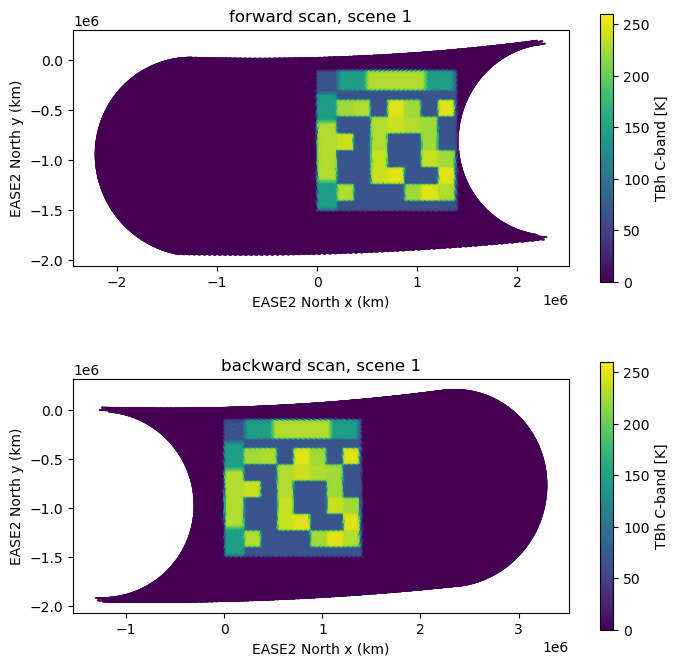

Python: None

In [7]:

fig,axs=pyplot.subplots(nrows=2,figsize=(8,8))
for (i,dir) in enumerate(["forward","backward"])
    im=i-1 #python indexing starts at 0
    @show size(xc[dir])
    @show size(yc[dir])
    @show size(band_data[dir][:,4])
    img=axs[im].scatter(xc[dir],yc[dir],c=band_data[dir][:,4], vmin=0,vmax=260,s=0.05)
    #img=axs[im].scatter(xc[dir],yc[dir],c=band_error[dir][:,4], vmin=0,vmax=2,s=0.05)
    fig.colorbar(img,ax=axs[im],label="TBh C-band [K]")
    axs[im].set_title(dir*" scan, scene 1")
    axs[im].set_aspect("equal")
    axs[im].set_xlabel("EASE2 North x (km)")
    axs[im].set_ylabel("EASE2 North y (km)")
end
fig.subplots_adjust(hspace=0.3)
display("image/png",fig)
fig.clf()

Now we can apply the Multi parameter retrieval using the simple user function `run_oem`. It takes the band data as produced by the `project_data` function, i.e., a matrix with (n, 10) dimensions, where n is the number of data points, and 10 is the number of channels. It returns the returns the retrieved parameters as similarly as (n, 9) matrix, where the columns are the retrieved parameters. The columns are the same as in the L1b data, i.e., `windspeed`, `total water vapor`, `cloud liquid water`, `sea surface temperature`, `ice surface temperature`, `sea ice concentration`, `multi year ice fraction`, `first year ice thickness`, `sea surface salinity`. The retrieval is done for each scan separately, i.e., the forward and backward scan are retrieved separately.

| Index | parameter                                               |
|-------|---------------------------------------------------------|
| 1     | windspeed [m/s]                                        |
| 2     | total water vapor [kg/m²]                              |
| 3     | cloud liquid water [kg/m²]                             |
| 4     | sea surface temperature [K]                            |
| 5     | ice surface temperature [K]                            |
| 6     | sea ice concentration [1]                              |
| 7     | multi year ice fraction [1]                            |
| 8     | first year ice thickness [cm]                          |
| 9     | sea surface salinity [ppt]                             |

The routine also returns the diagonal of the error covariance matrix of the retrieval and the residuals to the input brightness temperatures.

Here, as an example, we are applying the retrieval to the forward scan and colle

In [8]:
begin dir="forward"
    dat,errr,res=run_oem(deepcopy(band_data[dir]))#,band_error[dir])
    x,y = xc[dir],yc[dir]; #results from the project_data function above, all still in the scan geometry
    lat,lon = latc[dir],lonc[dir];
    scene1 = (;dat, errr, res, x, y, lat, lon) # a named tuple with the results
end

(dat = [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], errr = [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], res = [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], x = [2.2658575839116173e6, 2.263616864863913e6, 2.2613769208548455e6, 2.25913751624743e6, 2.256898661720919e6, 2.254660368924944e6, 2.2524226495427424e6, 2.250185515291162e6, 2.2479489767490285e6, 2.2457130477172746e6  …  -1.1972030672605904e6, -1.1950685716900236e6, -1.192934215940156e6, -1.1908002526663886e6, -1.1886665731164257e6, -1.1865331863176594e6, -1.184399989648546e6, -1.1822673381710346e6, -1.1801348989016695e6, -1.1780026768767962e6], y = [-1.7924938867602681e6, -1.7923501252246613e6, -1.7922011168530849e6, -1.7920468467108835e6, -1.791887316239713e6, -1.7917225268935596e6, -1.7915524801048199e6, -1.7913771772845674e6, -1.7911966200834797e6, -1.791010809757332e6  …  -15677.281434674747, -15806.128203413422, -1593

We are proding a cut out of our region of interest, i.e., the location of the test card, in EASE2 projection.

In [11]:

lea=pr.geometry.AreaDefinition("ease2_nh_testscene","ease2_nh_testscene","ease2_nh_testscene","EPSG:6931",1400,1400,[0,-1.5e6,1.4e6,-1e5]); #uses pyresample to define an area definition for the test region in the EASE2 grid
leaextent=[lea.area_extent[0],lea.area_extent[2],lea.area_extent[1],lea.area_extent[3]] #extent for the image, since order differs from the order in the area definition
ccrs=lea.to_cartopy_crs()

Python:
<Projected CRS: EPSG:6931>
Name: WGS 84 / NSIDC EASE-Grid 2.0 North
Axis Info [cartesian]:
- X[south]: Easting (metre)
- Y[south]: Northing (metre)
Area of Use:
- name: Northern hemisphere.
- bounds: (-180.0, 0.0, 180.0, 90.0)
Coordinate Operation:
- name: US NSIDC EASE-Grid 2.0 North
- method: Lambert Azimuthal Equal Area
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Test scene 1 - Radiomatric scene
Now we can plot the image of the retrieved parameters, here we chose the sea ice concentration, i.e., index 6.

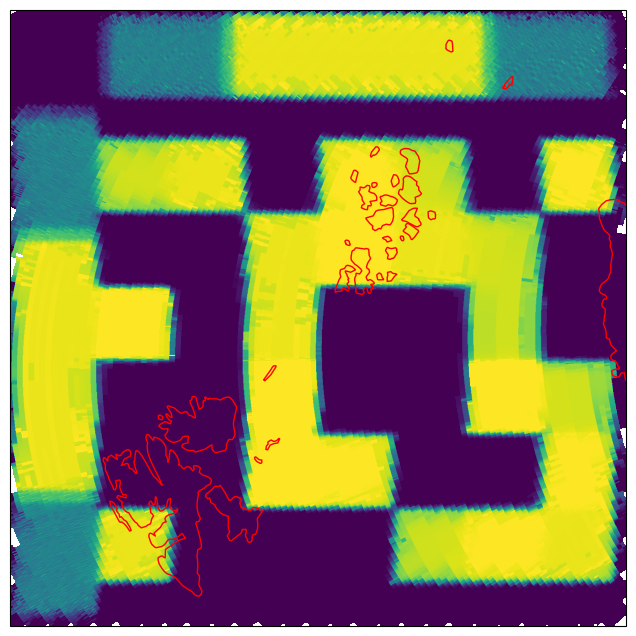

Python: None

In [13]:
outsic = OEM.project_data_to_area_nn(scene1.dat[:, 6], scene1.lat, scene1.lon, lea)
fig = pyplot.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection=ccrs)
ax.imshow(outsic, vmin=0, vmax=1, extent=leaextent, transform=ccrs)
ax.coastlines(color="red")
display(fig)
fig.clf()

We can plot all retrieved parameters in a single plot. We chose to define the plotting in a function, to reuse it for the backward scan and the other scenes.

In [40]:
"""
    plot_all_params(dat, x, y, swath=true,mask=true,errors=false)

Plot all parameters from the OEM output in a 3x3 grid.
parameter:
* dat: the output of the OEM algorithm (or error)
* x: the x-coordinates of the data
* y: the y-coordinates of the data
* swath: if true, plot the data as a scatter plot, if false, project the data 
to the EASE2 grid and plot as an image
* mask: if true, mask the data according to the sea ice concentration
* errors: if true, plot the error data instead of the data, changing the color scale, limits, etc. accordingly
"""
function plot_all_params(data; swath=true,mask=true,errors=false)
    ldata=deepcopy(data)

    fig, ax = pyplot.subplots(nrows=3, ncols=3, figsize=[15, 15], subplot_kw=PyDict(Dict("projection" => ccrs)))
    ax = pyconvert(Array, ax)
    x=ldata.x
    y=ldata.y
    lat=ldata.lat
    lon=ldata.lon
    if errors
        dat = ldata.errr
        mins = [0, 0, 0, 0, 0, 0, 0, 0, 0]
        maxs = [10, 10, 0.5, 10, 10, 0.3, 0.3, 100, 5]
        labs = ["windspeed error [m/s]", "total water vapor error [kg/m²]", "cloud liquid water error [kg/m²]",
            "sea surface temperature error [K]", "ice surface temperature error [K]", "sea ice concentration error [1]",
            "multi year ice fraction error [1]", "first year ice thickness error [cm]", "sea surface salinity error [ppt]"]
    else    
        dat = ldata.dat
        mins = [0, 0, 0, 250, 250, 0, 0, 0, 25]
        maxs = [20, 20, 0.5, 280, 280, 1, 1, 150, 40]
        labs = ["windspeed [m/s]", "total water vapor [kg/m²]", "cloud liquid water [kg/m²]",
        "sea surface temperature [K]", "ice surface temperature [K]", "sea ice concentration [1]",
        "multi year ice fraction [1]", "first year ice thickness [cm]", "sea surface salinity [ppt]"]
    end
    
    cm=pyplot.cm.viridis
    cm.set_bad("grey")
    
    if mask
        sic=ldata.dat[:,6] #sea ice concentration from original data input, independent if errors is set or not
        dat[sic.>0.9,1].=NaN
        dat[sic.>0.9,4].=NaN
        dat[sic.<0.1,5].=NaN
        dat[sic.<0.1,7].=NaN
        dat[sic.<0.1,8].=NaN
        dat[sic.>0.9,9].=NaN
    end

    for i = 1:9
        if swath
            pos = ax[i].scatter(x, y, c=dat[:, i], s=0.8, vmin=mins[i], vmax=maxs[i])
        else
            cimg = project_data_to_area_nn(dat[:, i], lat, lon, lea)
            leaextent = [lea.area_extent[0], lea.area_extent[2], lea.area_extent[1], lea.area_extent[3]]
            pos = ax[i].imshow(reshape(cimg, 1400, 1400), zorder=1, extent=leaextent, vmin=mins[i], vmax=maxs[i], origin="upper",cmap=cm)
        end
        ax[i].set_title(labs[i])
        cb = fig.colorbar(pos, ax=ax[i], shrink=0.7, orientation="vertical", pad=0.01)
        ax[i].coastlines()
    end
    pyplot.subplots_adjust(wspace=0.01, hspace=0.01)
    return fig
end

plot_all_params

Plotting the results resampled to the surface grid 1km EASE2 North. The scanlines are barely visible.

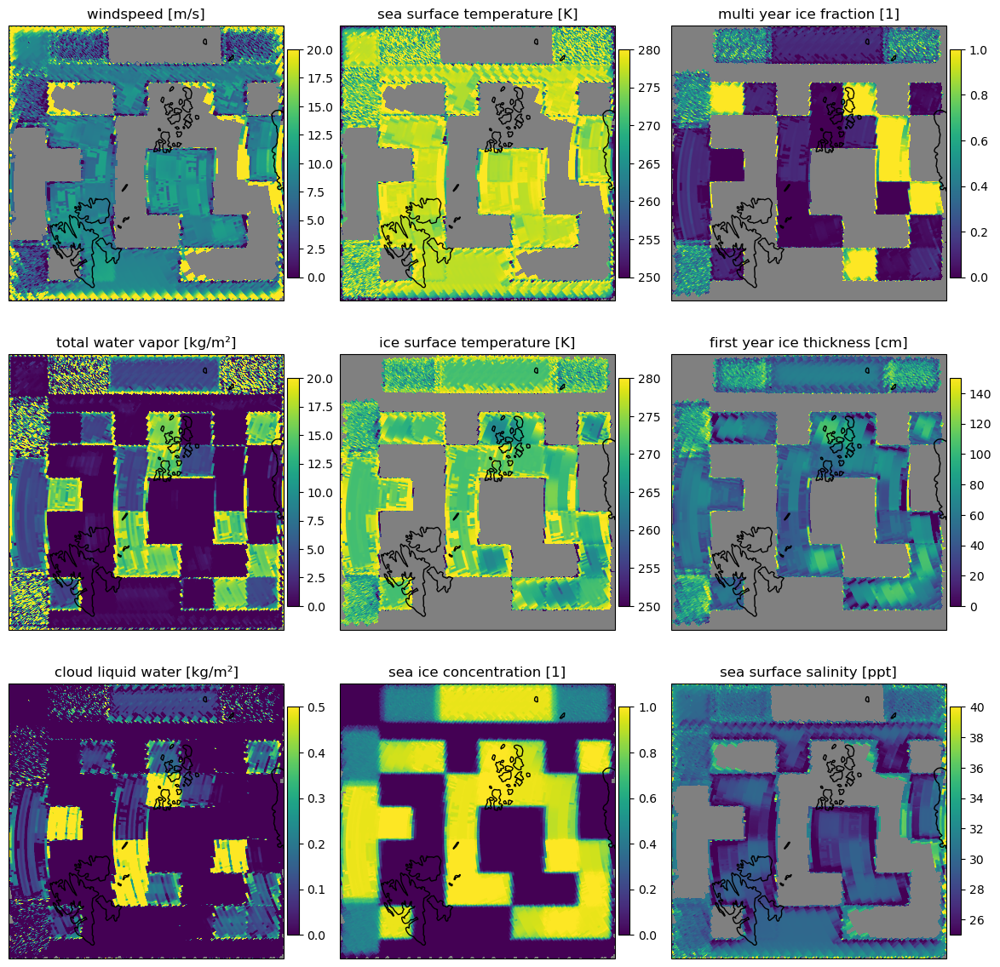

Python: None

In [41]:
fig=plot_all_params(scene1,swath=false)
display("image/png",fig)
fig.clf()

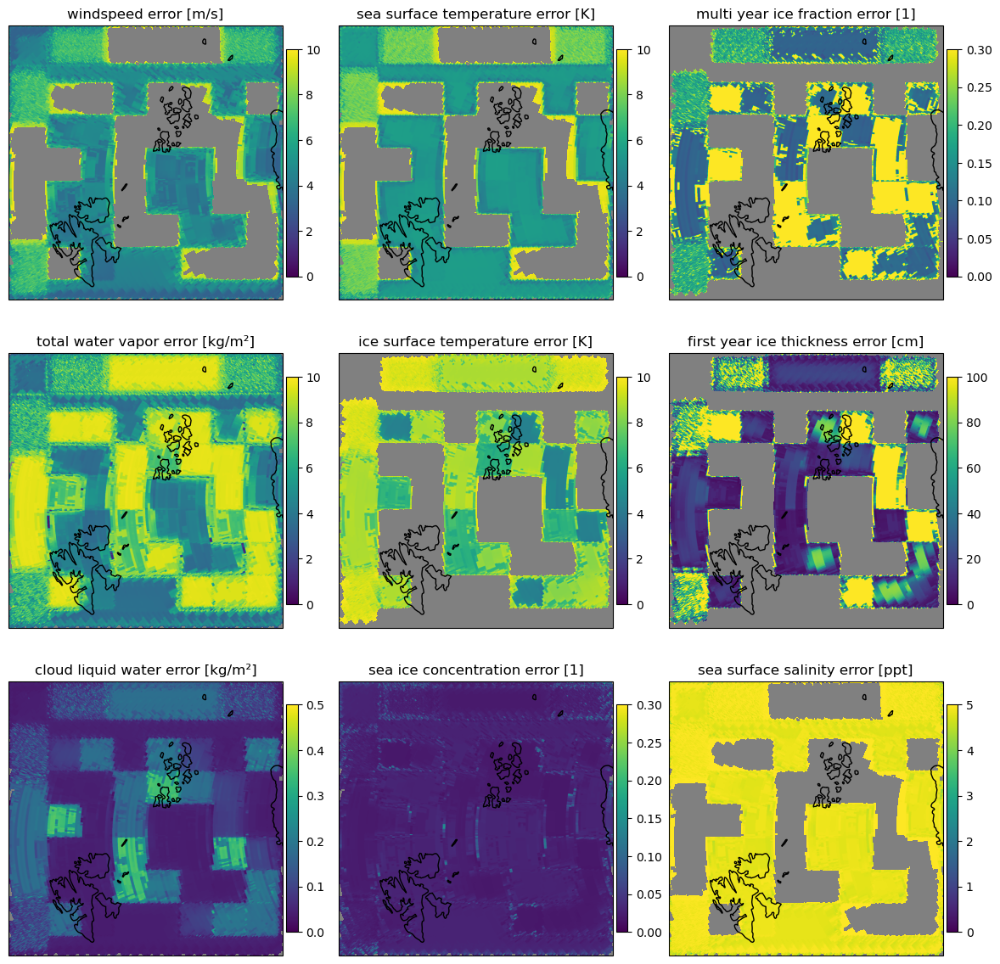

Python: None

In [16]:
fig=plot_all_params(scene1,swath=false,mask=true,errors=true)
display("image/png",fig)
fig.clf()

Now for comparison we can plot the retrieved data on the original input brightness temperature before the CIMR satellite simulator was applied. For Test scenes 1 and 2, the helper function `read_testscene` can be used. It reads the data from the test scenes and returns the brightness temperatures and the pyresample area definition and the image extent. The data block is also a 2d array with the dimensions (n, 10), where n is the number of data points, and 10 is the number of channels. This is to be able to use the same retrieval function for this dataset. The number of datapoints n, is here 1400*1400, i.e., the number of pixels in the test scene. The area definition is the same as for the CIMR data, i.e., EASE2 North 1km. The image extent is the extent of the image in the projection coordinates. This is needed to plot the data on the map. We also apply the retrieval directly to the input data now.


In [43]:
testinput, mea, imextent, surfaces=read_testscene(fns.scene1.input)
tdat,terr,tres=run_oem(deepcopy(testinput))
#variables_short=["ws","twv","clw","sst","ist","sic","myi","sit","sss"]
#gdata=(; variables_short[i]=>reshape(tdat[:,i],1400,1400) for i=1:9)

gdata = NamedTuple{(:ws, :twv, :clw, :sst, :ist, :sic, :myi, :sit, :sss)}(reshape(tdat[:,i],1400,1400)[end:-1:1,:] for i in 1:9)


(ws = [9.116867145671849 9.116867145671849 … 9.116867145671849 9.116867145671849; 9.116867145671849 9.116867145671849 … 9.116867145671849 9.116867145671849; … ; 9.116867145671849 9.116867145671849 … 9.116867145671849 9.116867145671849; 4.07161140314913 9.116867145671849 … 9.116867145671849 9.116867145671849], twv = [0.6053372124509058 0.6053372124509058 … 0.6053372124509058 0.6053372124509058; 0.6053372124509058 0.6053372124509058 … 0.6053372124509058 0.6053372124509058; … ; 0.6053372124509058 0.6053372124509058 … 0.6053372124509058 0.6053372124509058; 4.810163204192867 0.6053372124509058 … 0.6053372124509058 0.6053372124509058], clw = [-0.1963111824100347 -0.1963111824100347 … -0.1963111824100347 -0.1963111824100347; -0.1963111824100347 -0.1963111824100347 … -0.1963111824100347 -0.1963111824100347; … ; -0.1963111824100347 -0.1963111824100347 … -0.1963111824100347 -0.1963111824100347; 0.0898069750518064 -0.1963111824100347 … -0.1963111824100347 -0.1963111824100347], sst = [276.86632932

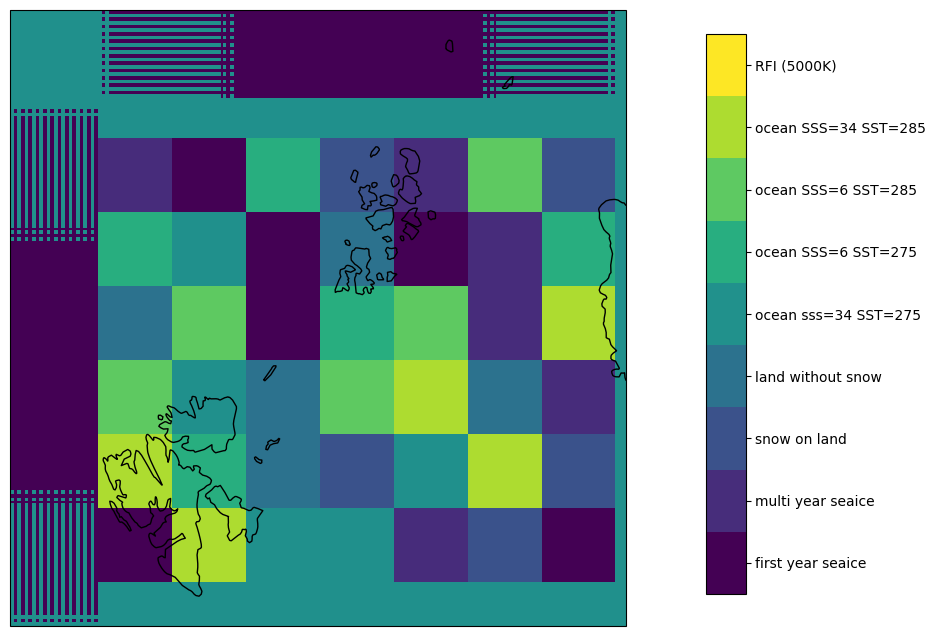

Python: None

In [44]:
surface_names=["first year seaice",
"multi year seaice",
"snow on land",
"land without snow",
"ocean sss=34 SST=275",
"ocean SSS=6 SST=275",
"ocean SSS=6 SST=285",
"ocean SSS=34 SST=285",
"RFI (5000K)"]

cmap = matplotlib.cm.get_cmap("viridis", 9)

fig = pyplot.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection=ccrs)
im=ax.imshow(surfaces[end:-1:1,:], extent=imextent, cmap=cmap,interpolation="nearest",vmin=0.5,vmax=9.5)

cbar_ax = fig.add_axes([0.9, 0.15, 0.04, 0.7])

cbar = fig.colorbar(im, cax=cbar_ax, ticks=1:9, orientation="vertical")
#now only show the range 0.5 to 9.5 area of the colorbar, so the surface names are centered for each color and there is no unused color
cbar.set_ticks(1:9)
cbar.ax.set_yticklabels(surface_names)

ax.coastlines()
display("image/png",fig)
fig.clf()



Now comparing teh retrieved sea ice concentration from the CIMR L1b simulated data to the sea ice concentration retrieved from the input data (to the simulator). The difference is very small, which is expected as the simulator is only adding noise to the data. The difference is only visible at the ice edges and at the intermediate ice concentration where slight scan pattern are visible from the simulated L1b data.

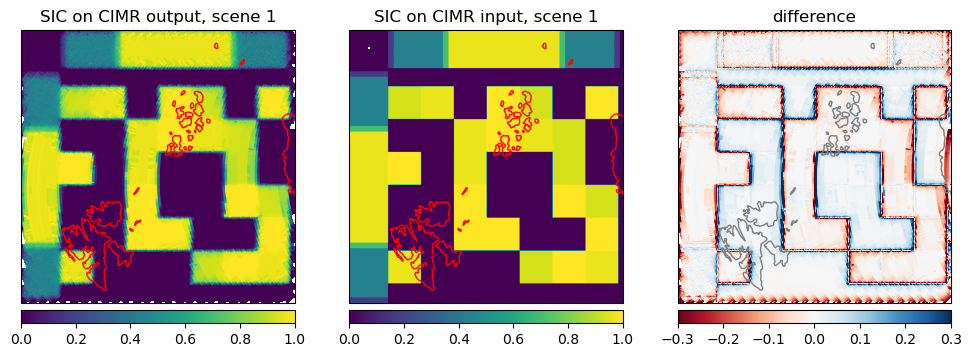

In [19]:
fig = pyplot.figure(figsize=(12, 8))

ax = fig.add_subplot(132, projection=ccrs)
ax.set_title("SIC on CIMR input, scene 1")
im=ax.imshow(gdata.sic,zorder=1,extent=imextent,vmin=0,vmax=1)
ax.coastlines(color="red")
pyplot.colorbar(im,orientation="horizontal",pad=0.01)

ax = fig.add_subplot(131, projection=ccrs)
ax.set_title("SIC on CIMR output, scene 1")
im=ax.imshow(outsic, vmin=0, vmax=1, extent=leaextent, transform=ccrs)
ax.coastlines(color="red")
pyplot.colorbar(im,orientation="horizontal",pad=0.01)

ax = fig.add_subplot(133, projection=ccrs)
ax.set_title("difference")
im=ax.imshow(outsic.-gdata.sic, vmin=-0.3, vmax=0.3, extent=leaextent, transform=ccrs,cmap="RdBu")
pyplot.colorbar(im,orientation="horizontal",pad=0.01)

ax.coastlines(color="gray")
display("image/png",fig)

## Test scene 2 - Geometric scene
We perform the same comparison for the test scene 2.

nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
min and max lon -179.3681677915786176.16184195309427
size(target_lat) = (366644,)
size(target_lon) = (366644,)


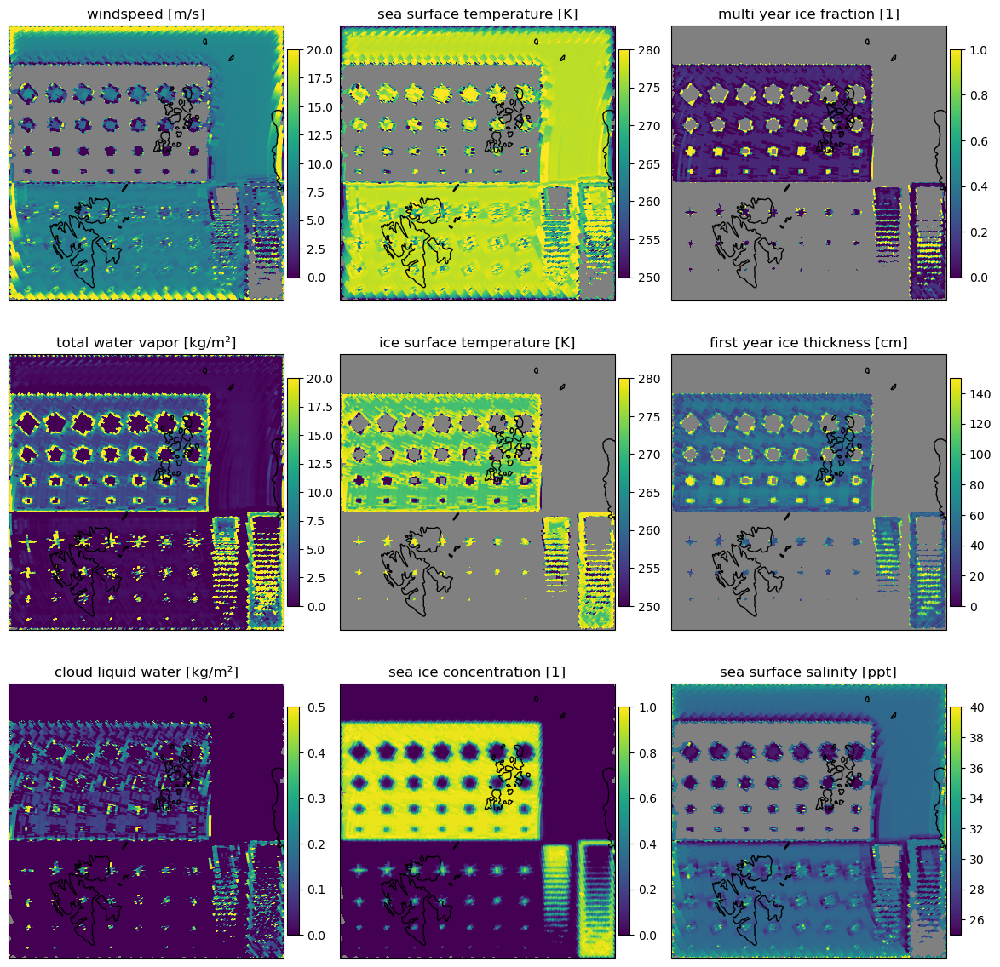

In [20]:
#get cimer results
begin dir="forward"
    test2datac,test2derror,lat,lon=project_data(fns.scene2.l1b,"C_BAND",dir)
    x,y=lltoxy.(lat,lon) |> x-> (first.(x),last.(x))
    dat,err,res=run_oem(deepcopy(test2datac))
    scene2 = (; dat, err, res, x, y, lat, lon)
end


plot_all_params(scene2, swath=false)

Then we read again the input and apply the retrieval to that data for comparison.

In [21]:
test2data,lea,imextent,surfaces=read_testscene(fns.scene2.input)
tdat,terr,tres=run_oem(deepcopy(test2data))
#plot_all_params(tdat, x, y, false)
gdata = NamedTuple{(:ws, :twv, :clw, :sst, :ist, :sic, :myi, :sit, :sss)}(reshape(tdat[:,i],1400,1400)[end:-1:1,:] for i in 1:9)


(ws = [9.116867145671849 9.116867145671849 … 9.116867145671849 9.116867145671849; 9.116867145671849 9.116867145671849 … 9.116867145671849 9.116867145671849; … ; 9.116867145671849 9.116867145671849 … 4.07161140314913 4.07161140314913; 9.116867145671849 9.116867145671849 … 4.07161140314913 4.07161140314913], twv = [0.6053372124509058 0.6053372124509058 … 0.6053372124509058 0.6053372124509058; 0.6053372124509058 0.6053372124509058 … 0.6053372124509058 0.6053372124509058; … ; 0.6053372124509058 0.6053372124509058 … 4.810163204192867 4.810163204192867; 0.6053372124509058 0.6053372124509058 … 4.810163204192867 4.810163204192867], clw = [-0.1963111824100347 -0.1963111824100347 … -0.1963111824100347 -0.1963111824100347; -0.1963111824100347 -0.1963111824100347 … -0.1963111824100347 -0.1963111824100347; … ; -0.1963111824100347 -0.1963111824100347 … 0.0898069750518064 0.0898069750518064; -0.1963111824100347 -0.1963111824100347 … 0.0898069750518064 0.0898069750518064], sst = [276.8663293205339 276

We focus on the sea ice concentration also on test scene 2.

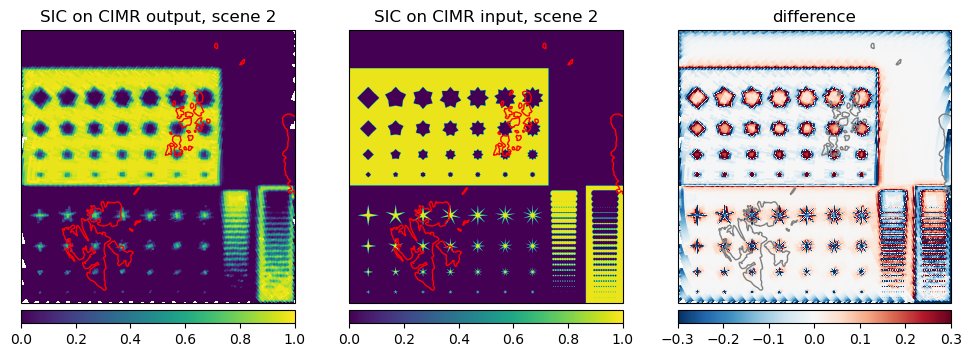

In [22]:
fig = pyplot.figure(figsize=(12, 8))
scene=2
ax = fig.add_subplot(132, projection=ccrs)
ax.set_title("SIC on CIMR input, scene $scene")

im=ax.imshow(gdata.sic ,zorder=1,extent=imextent,vmin=0,vmax=1)
ax.coastlines(color="red")
pyplot.colorbar(im,orientation="horizontal",pad=0.01)

ax = fig.add_subplot(131, projection=ccrs)
ax.set_title("SIC on CIMR output, scene $scene")
outsic=OEM.project_data_to_area_nn(dat[:,6],lat,lon,lea)

im=ax.imshow(outsic, vmin=0, vmax=1, extent=leaextent, transform=ccrs)
ax.coastlines(color="red")
pyplot.colorbar(im,orientation="horizontal",pad=0.01)

ax = fig.add_subplot(133, projection=ccrs)
ax.set_title("difference")
im=ax.imshow(outsic.-gdata.sic, vmin=-0.3, vmax=0.3, extent=leaextent, transform=ccrs,cmap="RdBu_r")
pyplot.colorbar(im,orientation="horizontal",pad=0.01)

ax.coastlines(color="gray")
display("image/png",fig)

The results are similar to the first test scene. The difference is very small, which is expected as the simulator is only adding noise to the data. The difference is only visible at the ice edges and at the intermediate ice concentration where slight scan pattern are visible from the simulated L1b data.

## Test scene SCEPS - Polar scene
We perform the same comparison for the SCEPS polar test scene.

Then we read again the input and apply the retrieval to that data for comparison. Since the format of the sceps input scene is slightly different, we have another reading routine for this dataset.

nedt found for L_BAND using nedt_150K_kelvin attribute, h=0.6708185415610074, v=0.6708185415610074 as uncertainty.
nedt found for C_BAND using nedt_150K_kelvin attribute, h=0.44721561161215845, v=0.44721561161215845 as uncertainty.
nedt found for X_BAND using nedt_150K_kelvin attribute, h=0.6708278148762012, v=0.6708278148762012 as uncertainty.
nedt found for KU_BAND using nedt_150K_kelvin attribute, h=0.8944211826297686, v=0.8944211826297686 as uncertainty.
nedt found for KA_BAND using nedt_150K_kelvin attribute, h=1.5651739137211957, v=1.5651739137211957 as uncertainty.
min and max lon -178.75016734585768179.73669687717927
size(target_lat) = (390216,)
size(target_lon) = (390216,)
nedt found for L_BAND using nedt_150K_kelvin attribute, h=0.6708185415610074, v=0.6708185415610074 as uncertainty.
nedt found for C_BAND using nedt_150K_kelvin attribute, h=0.44721561161215845, v=0.44721561161215845 as uncertainty.
nedt found for X_BAND using nedt_150K_kelvin attribute, h=0.6708278148762012,

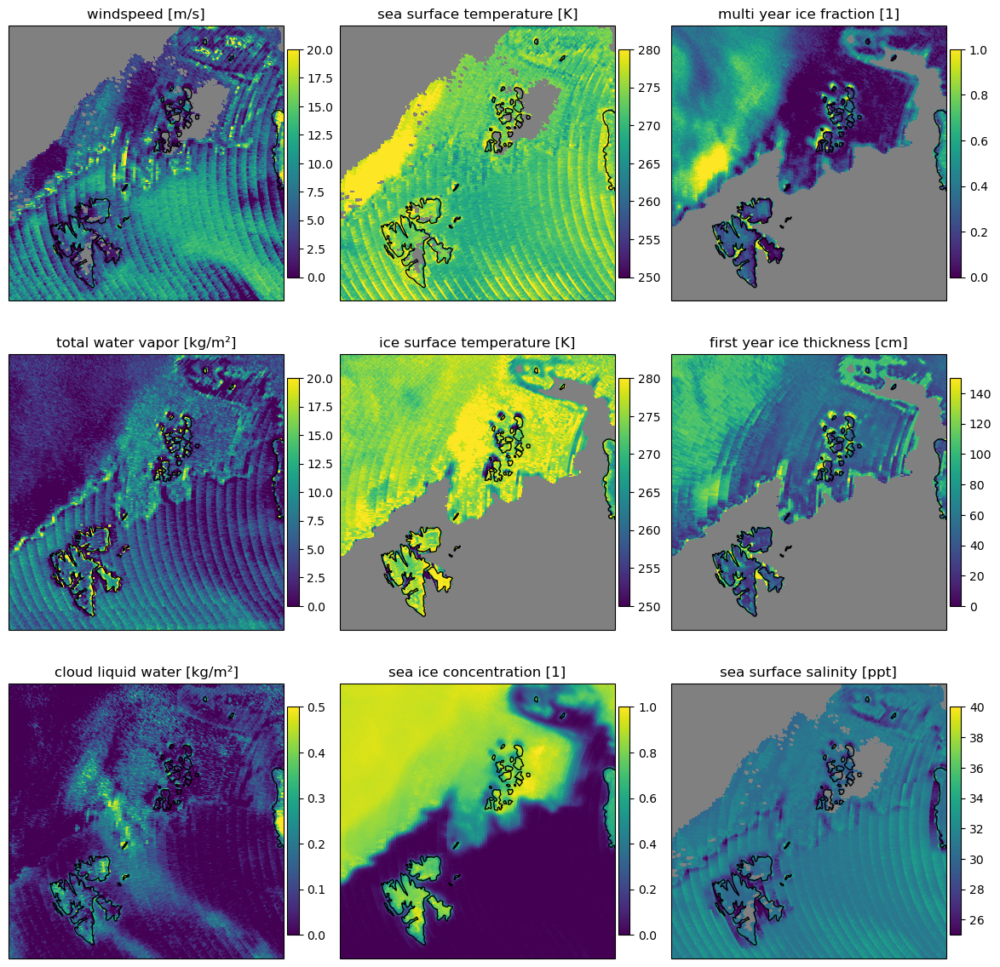

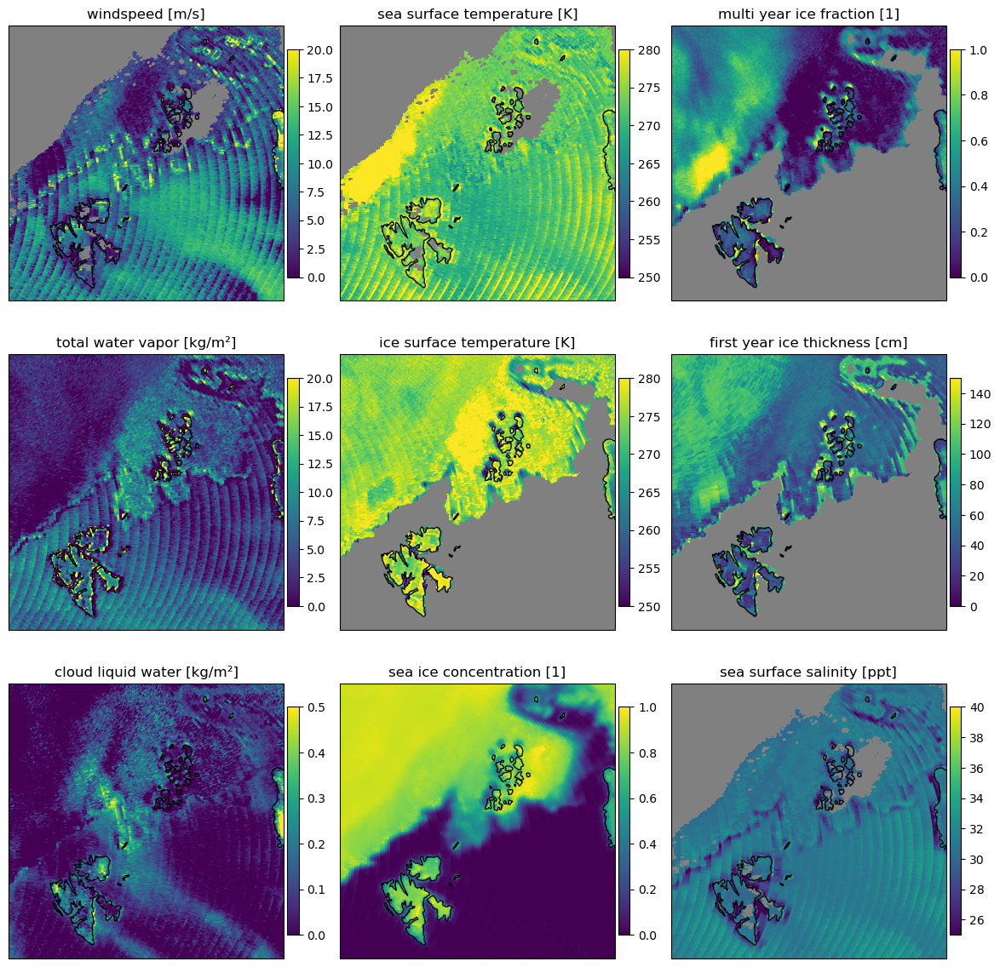

In [23]:
data=Dict()
for dir in ["forward","backward"]
    test2datac,test2errorc,lat,lon=project_data(fns.scenep.l1b,"C_BAND",dir)
    x,y=lltoxy.(lat,lon) |> x-> (first.(x),last.(x))
    dat,err,res=run_oem(deepcopy(test2datac))
    data[dir]=NamedTuple{(:ws, :twv, :clw, :sst, :ist, :sic, :myi, :sit, :sss)}(OEM.project_data_to_area_nn(dat[:,i],lat,lon,lea) for i in 1:9)
    datacollection=(;dat, err, res, x, y, lat, lon)
    fig=plot_all_params(datacollection, swath=false)
    display("image/png",fig)
end

In [24]:

stest,_,imextent=OEM.read_testscene_sceps(fns.scenep.input)
tdat,terr,tres=run_oem(deepcopy(stest))

gdata = NamedTuple{(:ws, :twv, :clw, :sst, :ist, :sic, :myi, :sit, :sss)}(reshape(tdat[:,i],1400,1400)|>rotl90 for i in 1:9)


(ws = [4.875039785981066 4.8732736805709465 … 5.786647085705715 5.787596436746945; 4.875018290982261 4.8739219956371125 … 5.866718258228034 5.866762751983686; … ; 9.553338223737395 9.55240503916129 … 13.53151049372122 13.530565067920183; 9.547572013656527 9.550564475966066 … 13.530802502601507 13.528495915182596], twv = [2.2205407577076506 2.2190629123051973 … 3.895831046999011 3.8954852425071516; 2.220601433648614 2.2204206381371394 … 3.7908574621156546 3.791230304137745; … ; 8.82210214990283 8.805610915645026 … 2.975531348094355 2.963821663803976; 8.823646163161635 8.807529779000323 … 2.983155357370815 2.9761986108982583], clw = [0.004430867074873877 0.004391063089624918 … 0.16861044988822727 0.16859045466824002; 0.004557048214718368 0.004402175426342943 … 0.18883321313946197 0.18893603295122777; … ; 0.20916939774626206 0.20861846090924877 … 0.04636294071794186 0.04565913333262826; 0.20924406002170662 0.20871892838733208 … 0.04758317424188328 0.046853554922896765], sst = [274.7498968

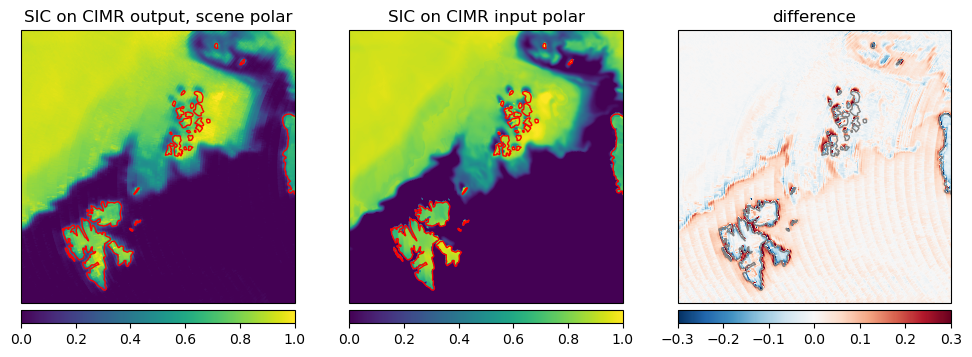

In [25]:
fig = pyplot.figure(figsize=(12, 8))
scene="polar"
ax = fig.add_subplot(132, projection=ccrs)
ax.set_title("SIC on CIMR input $scene")
im=ax.imshow(gdata.sic,zorder=1,extent=imextent,vmin=0,vmax=1)
ax.coastlines(color="red")
pyplot.colorbar(im,orientation="horizontal",pad=0.01)

ax = fig.add_subplot(131, projection=ccrs)
ax.set_title("SIC on CIMR output, scene $scene")
#outsic=OEM.project_data_to_area_nn(dat[:,6],lat,lon,lea)

im=ax.imshow(data["forward"].sic, vmin=0, vmax=1, extent=leaextent, transform=ccrs)
ax.coastlines(color="red")
pyplot.colorbar(im,orientation="horizontal",pad=0.01)

ax = fig.add_subplot(133, projection=ccrs)
ax.set_title("difference")
im=ax.imshow(data["forward"].sic.-gdata.sic, vmin=-0.3, vmax=0.3, extent=leaextent, transform=ccrs,cmap="RdBu_r")
pyplot.colorbar(im,orientation="horizontal",pad=0.01)

ax.coastlines(color="gray")
display("image/png",fig)

In [26]:

gdata_true,latt,lont = let
     #fn="/home/huntemann/CIMR_L1X/cimr_sceps_geo_card_polarscene_1_20161217_v1p0_part1.nc"
    fn="/mnt/spaces/Projects/2022_CIMR-DEVALGO/cimr_sceps_geo_card_devalgo_polarscene_1_20161217_harmonised_v2p0_surface.nc"


    NamedTuple{(:ws, :twv, :clw, :sst, :ist, :sic, :myi, :sit, :sss, :snd, :fdn)}((
    (((NCDataset(fn)["surface_wind_u"][:,:,1]).^2f0
    .+(NCDataset(fn)["surface_wind_v"][:,:,1]).^2f0).^(0.5f0))[end:-1:1,:],
    NCDataset(fn)["total_column_water_vapour"][:,:,1][end:-1:1,:],
    NCDataset(fn)["total_column_liquid_water"][:,:,1][end:-1:1,:],
    NCDataset(fn)["sea_surface_temperature"][:,:,1][end:-1:1,:],
    NCDataset(fn)["sea_ice_temperature"][:,:,1][end:-1:1,:],
    NCDataset(fn)["sea_ice_concentration"][:,:,1][end:-1:1,:]/100.0f0,
    NCDataset(fn)["sea_ice_type"][:,:,1][end:-1:1,:], #1=multiyear, 0=first year (or no ice)
    NCDataset(fn)["sea_ice_thickness"][:,:,1][end:-1:1,:]*100.0f0,
    
    NCDataset(fn)["sea_surface_salinity"][:,:,1][end:-1:1,:],
    NCDataset(fn)["snow_thickness"][:,:,1][end:-1:1,:]*100.0f0,
    NCDataset(fn)["freezing_days_number"][:,:,1][end:-1:1,:]
    )),
    NCDataset(fn)["latitude"][:,:,1][end:-1:1],
    NCDataset(fn)["longitude"][:,:,1][end:-1:1]
end






((ws = Float32[3.7947714 3.794284 … 3.0858896 3.086414; 3.788846 3.788365 … 3.0873625 3.0878778; … ; 5.7471194 5.7528105 … 10.598608 10.594946; 5.746113 5.7518773 … 10.596718 10.593062], twv = Float32[2.021483 2.0243766 … 2.5583575 2.5583787; 2.0261867 2.029098 … 2.5601096 2.5601356; … ; 9.884644 9.871296 … 7.449344 7.4442635; 9.8852005 9.871857 … 7.4541707 7.4490976], clw = Float32[0.007443937 0.007411483 … 0.0033449917 0.003319899; 0.0074116513 0.007379636 … 0.0033434134 0.0033182555; … ; 0.22140396 0.22076993 … 0.048204187 0.047599345; 0.22157292 0.22094865 … 0.049164433 0.04855822], sst = Float32[271.41547 271.41547 … 271.61148 271.60995; 271.41553 271.41553 … 271.6118 271.61026; … ; 274.7821 274.77713 … 277.5352 277.53275; 274.77994 274.77484 … 277.53555 277.53302], ist = Float32[251.31357 251.32018 … 252.61086 252.60388; 251.31313 251.31972 … 252.61545 252.60843; … ; 270.53833 270.54248 … 270.9939 270.99683; 270.54108 270.5455 … 270.99512 270.99802], sic = Float32[0.93725663 0.93

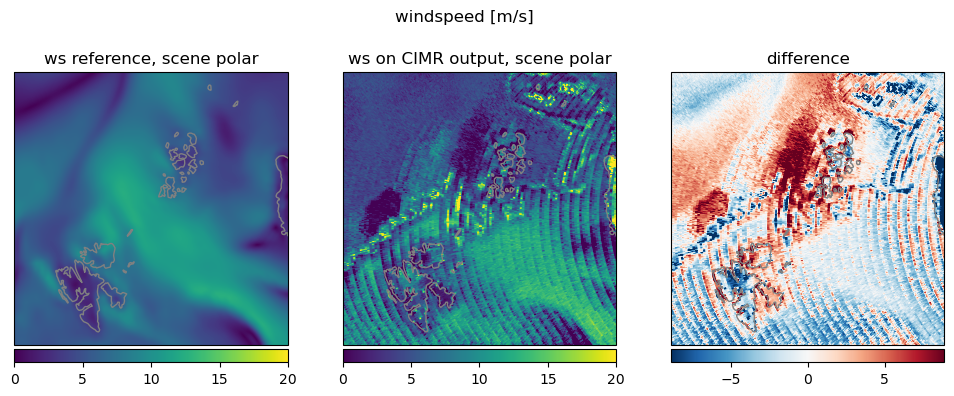

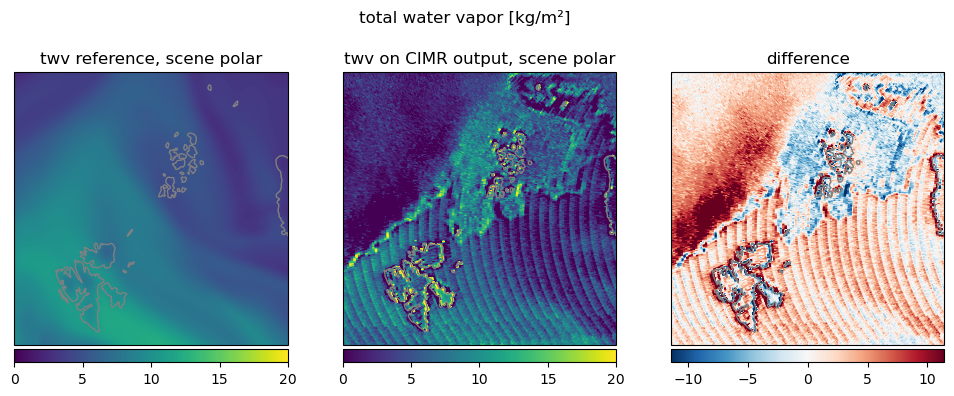

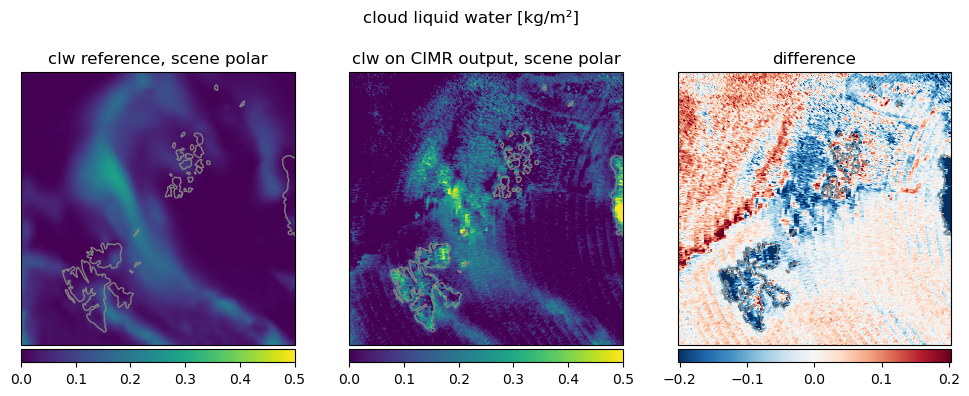

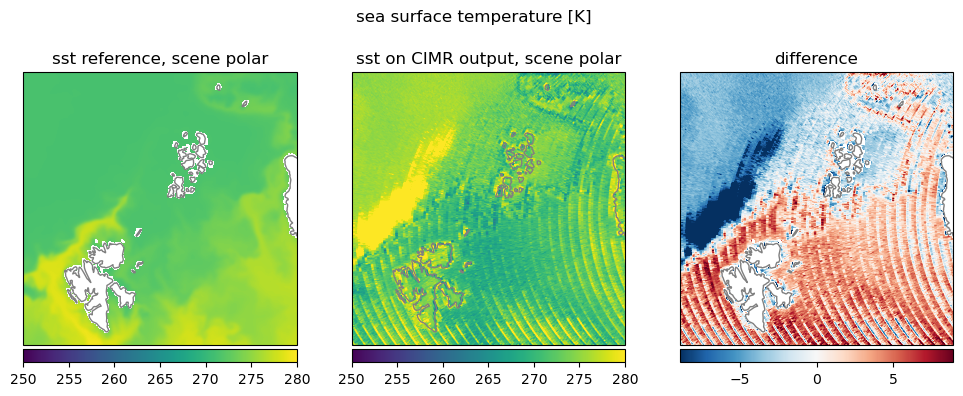

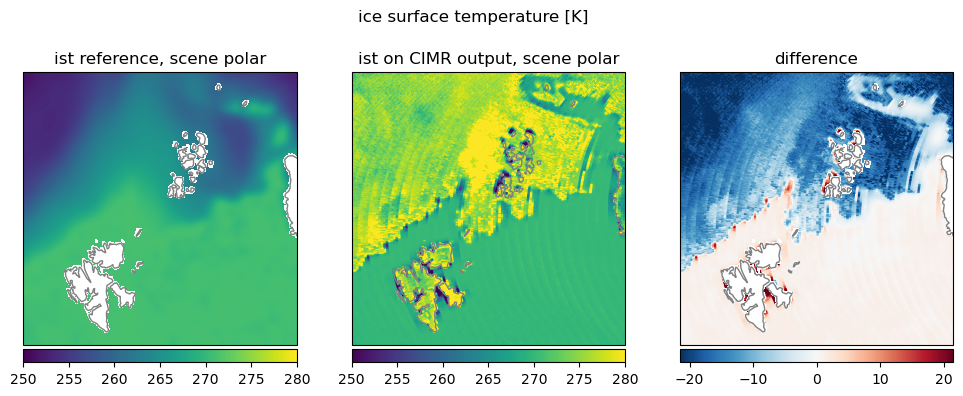

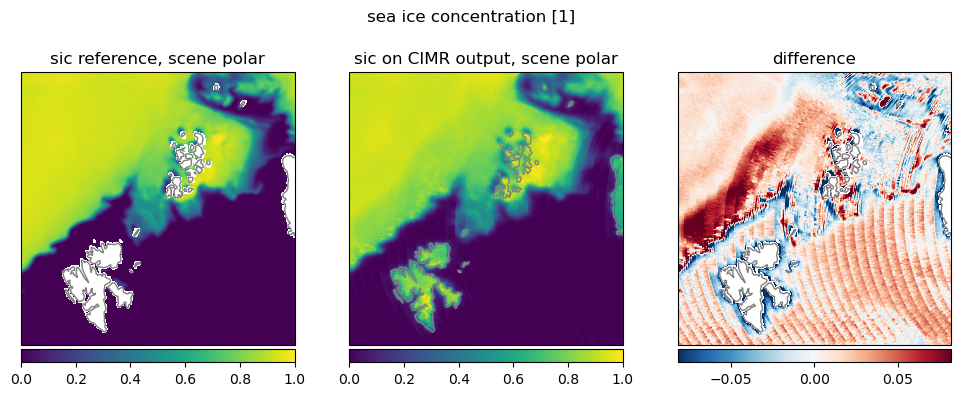

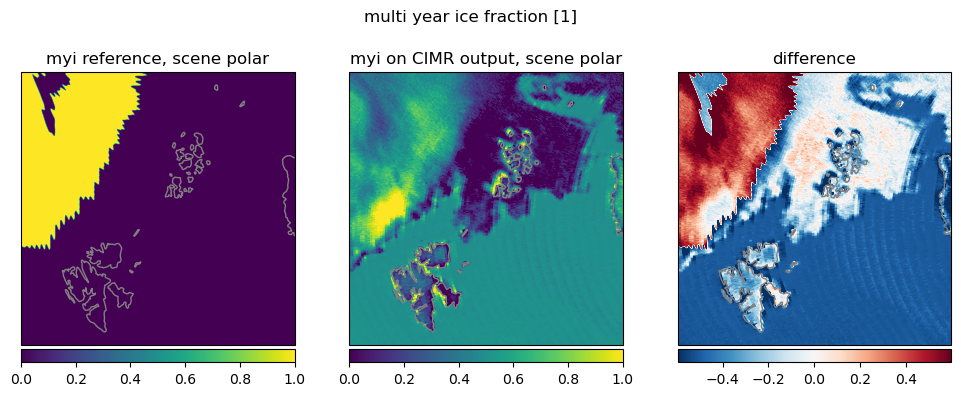

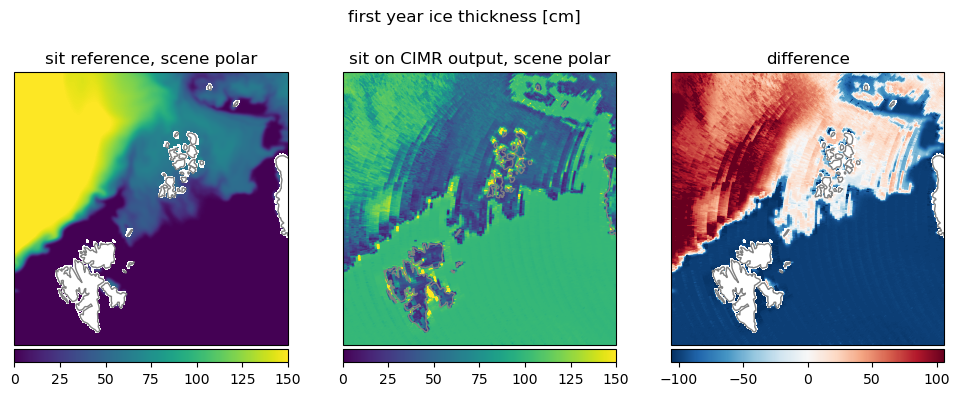

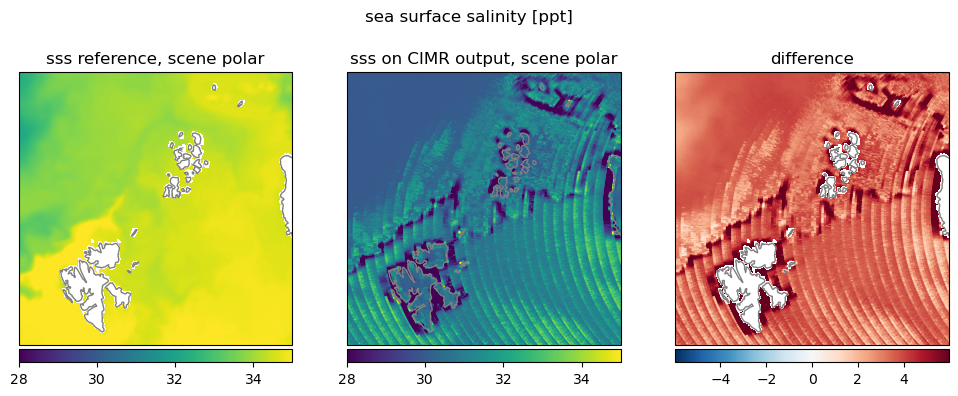

In [27]:


mmdict=Dict("ws"=>[0,20],"twv"=>[0,20],"clw"=>[0,0.5],"sst"=>[250,280],"ist"=>[250,280],"sic"=>[0,1],"myi"=>[0,1],"sit"=>[0,150],"sss"=>[28,35], "snd"=>[0,50],"fdn"=>[0,100])
#variable names and units
labdict=Dict("ws"=>"windspeed [m/s]","twv"=>"total water vapor [kg/m²]","clw"=>"cloud liquid water [kg/m²]","sst"=>"sea surface temperature [K]","ist"=>"ice surface temperature [K]","sic"=>"sea ice concentration [1]","myi"=>"multi year ice fraction [1]","sit"=>"first year ice thickness [cm]","sss"=>"sea surface salinity [ppt]", "snd"=>"snow thickness [cm]","fdn"=>"freezing days number [1]")


#varname="twv"
dir="forward"
for varname in ["ws","twv","clw","sst","ist","sic","myi","sit","sss"]
    mins,maxs = mmdict[varname]
    fig = pyplot.figure(figsize=(12, 4.5))
    scene="polar"
    fig.suptitle(labdict[varname])
    ax = fig.add_subplot(132, projection=ccrs)
    ax.set_title("$varname on CIMR output, scene $scene")
    im=ax.imshow(getfield(data["forward"],Symbol(varname)),zorder=1,extent=leaextent,vmin=mins,vmax=maxs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im,orientation="horizontal",pad=0.01)


    ax = fig.add_subplot(131, projection=ccrs)
    ax.set_title("$varname reference, scene $scene")

    im=ax.imshow(getfield(gdata_true,Symbol(varname)), vmin=mins, vmax=maxs, extent=leaextent, transform=ccrs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im,orientation="horizontal",pad=0.01)

    ax = fig.add_subplot(133, projection=ccrs)
    ax.set_title("difference")
    diffs=getfield(gdata_true,Symbol(varname)).-getfield(data[dir],Symbol(varname))
    using Statistics
    diffmax=quantile(filter(!isnan,abs.(diffs)[:]) ,0.95)
    im=ax.imshow(diffs, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs,cmap="RdBu_r")
    pyplot.colorbar(im,orientation="horizontal",pad=0.01)

    ax.coastlines(color="gray")
    display("image/png",fig)
end

In [28]:

using Statistics
#DRAFT: plot reference, forward and backward with corresponding differences
#layout: 3x3, first row: reference, forward, difference to reference
#second row: retrieved on CIMR input, backward, difference to reference
#third row: difference bteween reference and retrieved, difference between forward and backward, empty

#reference is in variable gdata_true
#retrieved on CIMR input is in variable gdata
#retrieved on CIMR output is in variable data which is a Dict with keys "forward" and "backward"

#variable ranges

mmdict=Dict("ws"=>[0,20],"twv"=>[0,20],"clw"=>[0,0.5],"sst"=>[250,280],"ist"=>[250,280],"sic"=>[0,1],"myi"=>[0,1],"sit"=>[0,150],"sss"=>[25,40])

#variable names and units
labdict=Dict("ws"=>"windspeed [m/s]","twv"=>"total water vapor [kg/m²]","clw"=>"cloud liquid water [kg/m²]","sst"=>"sea surface temperature [K]","ist"=>"ice surface temperature [K]","sic"=>"sea ice concentration [1]","myi"=>"multi year ice fraction [1]","sit"=>"first year ice thickness [cm]","sss"=>"sea surface salinity [ppt]")

sic = getfield(gdata_true, :sic)



scene="polar"
#varname="twv"
#for varname in ["sic"]#["ws","twv","clw","sst","ist","sic","myi","sit","sss"]
for varname in ["ws","twv","clw","sst","ist","sic","myi","sit","sss"]

    #get variables from dicts for given varname
    reference = getfield(gdata_true,Symbol(varname))
    input_retrieved = getfield(gdata,Symbol(varname))
    forward = getfield(data["forward"], Symbol(varname))
    backward = getfield(data["backward"], Symbol(varname))

    #calculate maximum min max for difference plot for comparison
    diffmax=max(quantile(filter(!isnan, abs.(forward - backward)[:]), 0.95),
    quantile(filter(!isnan, abs.(reference - backward)[:]), 0.95),
    quantile(filter(!isnan, abs.(reference - forward)[:]), 0.95),
    quantile(filter(!isnan, abs.(reference - input_retrieved)[:]), 0.95))

    #colorbar_orientation = "horizontal"
    colorbar_orientation = "vertical"

    mins, maxs = mmdict[varname]
    fig = pyplot.figure(figsize=(15, 13))
    #fig.suptitle(labdict[varname])

    # upper left: reference
    ax = fig.add_subplot(331, projection=ccrs)
    im = ax.imshow(reference, vmin=mins, vmax=maxs, extent=leaextent, transform=ccrs)
    ax.set_title("$(labdict[varname]) reference")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # upper middle: forward
    ax = fig.add_subplot(332, projection=ccrs)
    ax.set_title("retrieved $varname on CIMR output, forward")
    im = ax.imshow(forward, zorder=1, extent=leaextent, vmin=mins, vmax=maxs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # upper right: difference reference - forward
    ax = fig.add_subplot(333, projection=ccrs)
    ax.set_title("difference reference - forward")
    im = ax.imshow(reference - forward, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs, cmap="RdBu_r")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # middle left: input_retrieved
    ax = fig.add_subplot(334, projection=ccrs)
    ax.set_title("retrieved $varname on CIMR input")
    im = ax.imshow(input_retrieved, zorder=1, extent=leaextent, vmin=mins, vmax=maxs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # middle middle: backward
    ax = fig.add_subplot(335, projection=ccrs)
    ax.set_title("retrieved $varname on CIMR output, backward")
    im = ax.imshow(backward, zorder=1, extent=leaextent, vmin=mins, vmax=maxs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # middle right: difference reference - backward
    ax = fig.add_subplot(336, projection=ccrs)
    ax.set_title("difference reference - backward")
    im = ax.imshow(reference - backward, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs, cmap="RdBu_r")
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # lower left: difference reference - input_retrieved
    ax = fig.add_subplot(337, projection=ccrs)
    ax.set_title("difference reference - CIMR input retrieved")
    im = ax.imshow(reference - input_retrieved, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs, cmap="RdBu_r")
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)
    
    # lower middle: difference forward - backward
    ax = fig.add_subplot(338, projection=ccrs)
    ax.set_title("difference forward - backward")
    im = ax.imshow(forward - backward, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs, cmap="RdBu_r")
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    #done
    #add space between subplots
    pyplot.subplots_adjust(wspace=0.05, hspace=0.08)

    #save and display
    pyplot.savefig("mpr_comparison_$(scene)_$(varname).png", dpi=150, bbox_inches="tight")
    #display("image/png", fig)
end

In [29]:
# example to write out a file
#forward 
findata,finerror,flat,flon=project_data(fns.scene2.l1b,"C_BAND","forward")
fdat,ferr,_=run_oem(deepcopy(findata))#,deepcopy(finerror))
#backward
bindata,binerror,blat,blon=project_data(fns.scene2.l1b,"C_BAND","backward")
bdat,berr,_=run_oem(deepcopy(bindata))#,deepcopy(binerror)))

thedata=(;forward=(;data=fdat,err=ferr,lat=flat,lon=flon),
         backward=(;data=bdat,err=berr,lat=blat,lon=blon))



nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
min and max lon -179.3681677915786176.16184195309427
size(target_lat) = (366644,)
size(target_lon) = (366644,)
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
nedt not found, using 1.0K as uncertainty for h and v.
min and max lon -178.9132688940353179.08371216641004
size(target_lat) = (389932,)
size(target_lon) = (389932,)


(forward = (data = [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], err = [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], lat = [63.890914290838836, 63.90791491055281, 63.924934109659816, 63.94197371779593, 63.9590336921627, 63.97611398288767, 63.99321453998183, 64.01033531333847, 64.0274762596718, 64.04463731476002  …  79.26352261753735, 79.28270666627351, 79.30188835598, 79.3210653977545, 79.34023875008641, 79.359408312264, 79.37857498598306, 79.39773556024241, 79.41689300503816, 79.43604725259478], lon = [51.65288398640183, 51.627534169911954, 51.602243129387126, 51.57700824077215, 51.55182965684786, 51.52670754310826, 51.50164206675462, 51.47663339669757, 51.45168168494119, 51.426787130618095  …  -89.24975908626277, -89.24224295040199, -89.23446393065154, -89.22642155131621, -89.21811402534001, -89.20953998094524, -89.2006975515435, -89.19158683642888, -89.18220496282521, -89.17255047604522]), backward = (data = [Na

In [34]:
store_output("test2_forward.nc",thedata,"ease2_nh")


(xsize, ysize, length(x), length(y)) = (1440, 1440, 1440, 1440)


"macrus.huntemann@uni-bremen.de"

In [35]:
using Dates

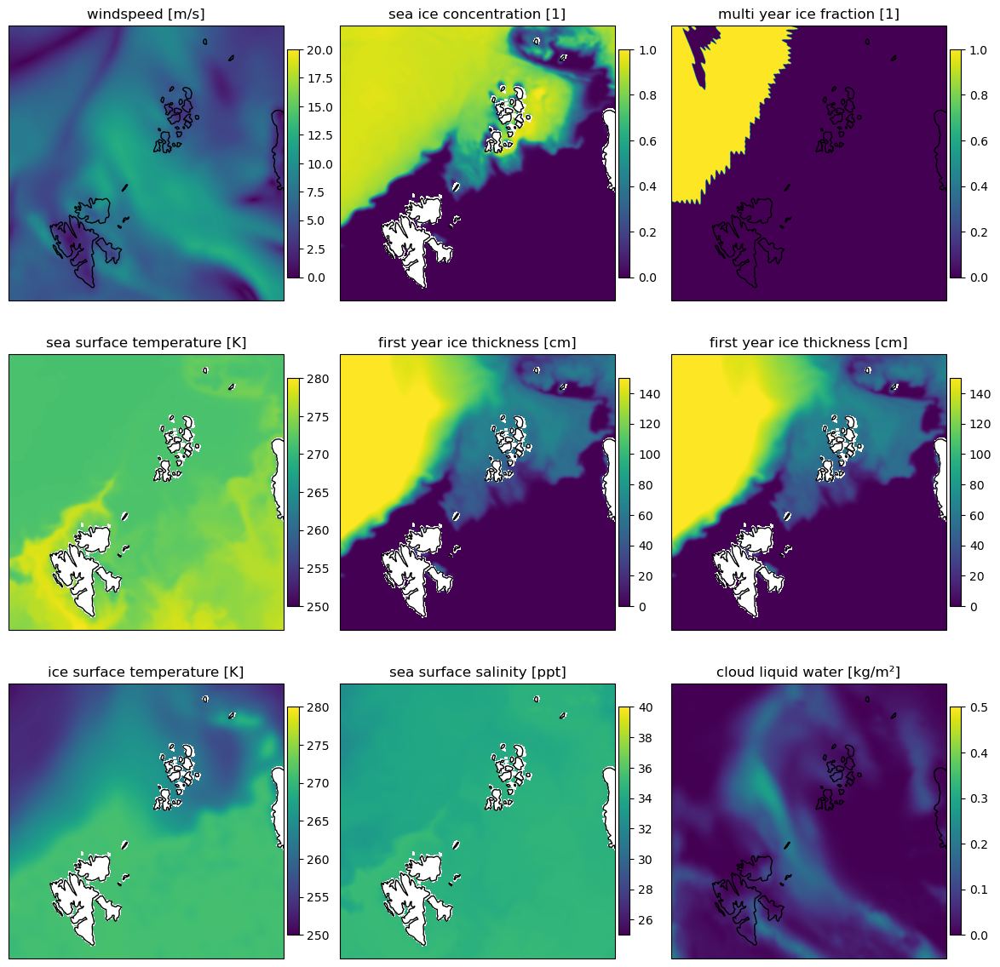

In [36]:
#overview plot of all gdata_true variables 3x3 grid
fig,ax=pyplot.subplots(nrows=3,ncols=3,figsize=[15,15],subplot_kw=PyDict(Dict("projection"=> ccrs)))
ax=pyconvert(Array,ax)[:]

for (i,varname) in enumerate((:ws, :sst, :ist, :sic, :sit, :sss, :myi, :sit, :clw))
    mins,maxs = mmdict[string(varname)]
    pos=ax[i].imshow(getfield(gdata_true,varname),extent=leaextent,vmin=mins,vmax=maxs,cmap="viridis",transform=ccrs)
    cb=fig.colorbar(pos,ax=ax[i],shrink=0.7,orientation="vertical",pad=0.01)
    ax[i].set_title(labdict[string(varname)])
    #ax[i].set_extent(extent,mycrs)
    ax[i].coastlines()
end
pyplot.subplots_adjust(wspace=0.01,hspace=0.01)
display("image/png",fig)